# Read .mot motion data (HDF5) using tables

In [15]:
import numpy as np
import os
np.set_printoptions(threshold=10)#np.nan

In [16]:
os.listdir(os.getcwd() + "/motion_tensors/")

['motion_vectors_brocks2.hdf5',
 'motion_vectors_farneback2.hdf5',
 'motion_vectors_h264.h5',
 'motion_vectors_h264_median.hdf']

In [17]:
import tables
import os

h264_median = os.getcwd() + "/motion_tensors/motion_vectors_h264_median.hdf"
f2 = tables.open_file(h264_median, mode='r')

In [18]:
f2.root.motion_tensor

/motion_tensor (CArray(30020, 67, 120, 2)) ''
  atom := Float64Atom(shape=(), dflt=0.0)
  maindim := 0
  flavor := 'numpy'
  byteorder := 'little'
  chunkshape := (4, 67, 120, 2)

In [19]:
c = f2.root.motion_tensor

# Single frame strength of motion

In [20]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [21]:
def colorcoded_vectors(d):
    ary = np.array([d[:,:,0].flatten(),d[:,:,1].flatten()])
    rad = np.arctan2(ary[0],ary[1])#compute radiants from vectors
    length = np.linalg.norm(ary, axis = 0)#compute length of vectors
    rad =(((rad.reshape(d.shape[0:2])/np.pi)+1)/2)*255 #reshape and make them fill up 0-255
    length = length.reshape(d.shape[0:2])*25#reshape length of vector arbitrary value 255: change for "thresholding"

    hsv_shape = list(d.shape)
    hsv_shape[-1] = 3#Three channels i.e. hue saturation value
    hsv = np.ndarray(hsv_shape)
    hsv.fill(255)#value (of hsv)is highest 
    hsv[:,:,0] = rad
    hsv[:,:,1] = length

    hsv = np.asarray(hsv, dtype = np.uint8)
    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    return rgb

red 		 --> 	 right
turquois 	 /|\ 	 up
blue 		 <-- 	 left
purple		 \|/ 	 down


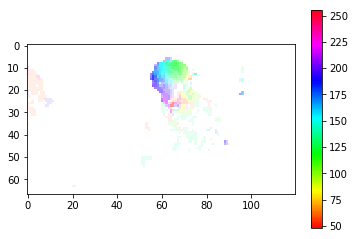

In [22]:
plt.imshow(colorcoded_vectors(c[320]), cmap = "hsv")
plt.colorbar()
print("red \t\t --> \t right")
print("turquois \t /|\ \t up")
print("blue \t\t <-- \t left")
print("purple\t\t \|/ \t down")


In [23]:
#plt.imshow(deg[length>4500].reshape(deg.shape), cmap = "hsv")
#plt.colorbar()
#plt.clim(-np.pi, np.pi);

<IPython.core.display.Javascript object>


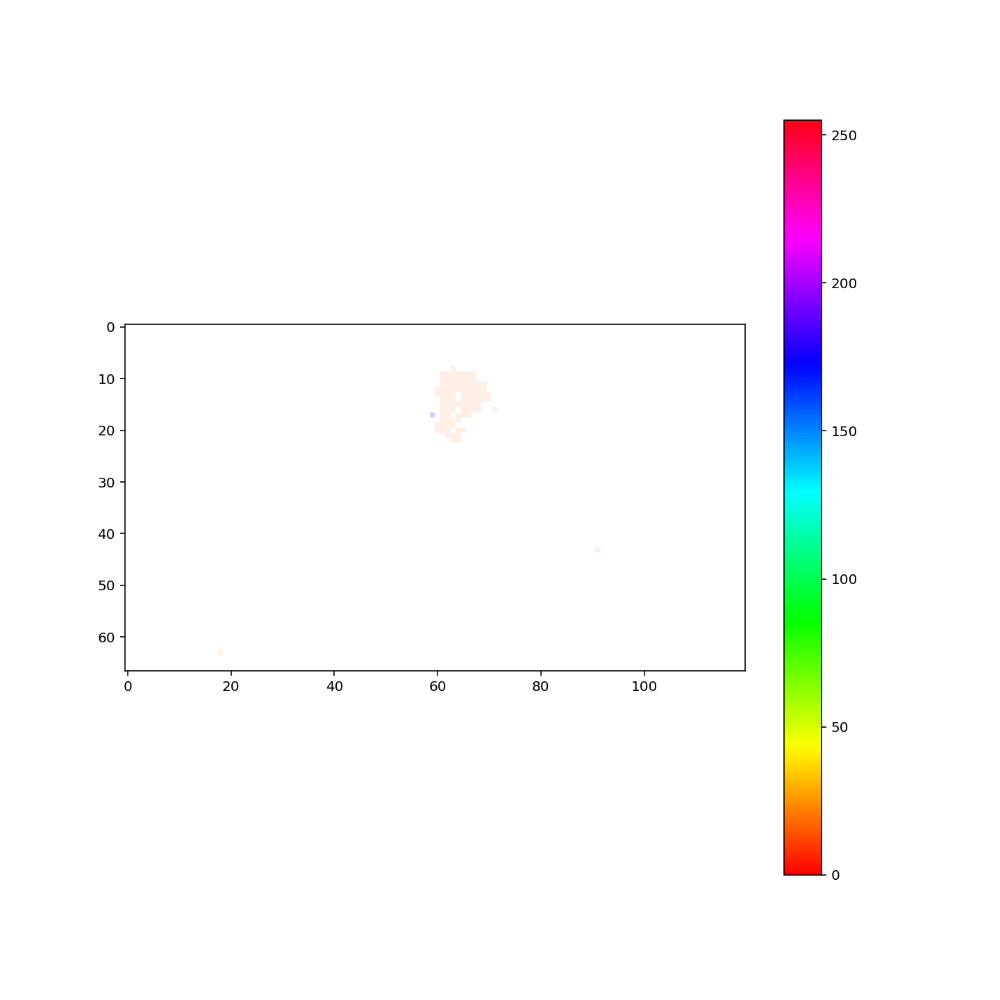

In [31]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
 
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)

im = ax.imshow(colorcoded_vectors(c[0]), vmin = 0, vmax = 255, cmap = "hsv")
plt.colorbar(im,ax=ax)


for x in range(0,1000):#USER INFO: ADJUST THE RANGE OF FRAMES TO BE DISPLAYED HERE
    ax.cla()
    im = ax.imshow(colorcoded_vectors(c[x]), vmin = 0, vmax = 255, cmap = "hsv")
    fig.canvas.draw()

/home/gerstenberger/miniconda3/lib/python3.6/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


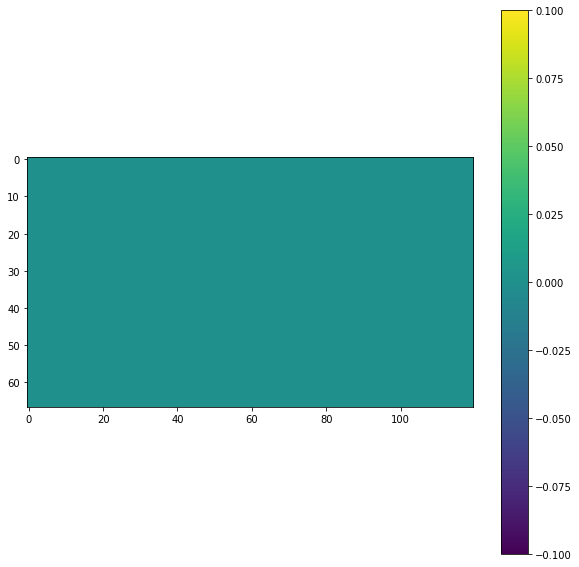

In [30]:
import matplotlib.pyplot as plt
%matplotlib inline

frame = 9320

fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(111)



U2 = c[frame][:,:,0]
V2 = c[frame][:,:,1]


ax2 = fig.add_subplot(111)
im = ax2.imshow(U2+V2)

fig.colorbar(im)
fig.show()

In [38]:
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
import cv2
import imageio

width = 120
height = 67

matplotlib.rcParams['animation.embed_limit'] = 2**128


#video_file = os.getcwd() + "\\in\\00_sth.mov"
video_file = os.getcwd() + "/RPS_05_PS_C2.wmv"

cap = cv2.VideoCapture(video_file)
video_reader = imageio.get_reader(video_file)

plt.ioff()

start_frame = 300#9335#300
frames = 20#30SUBJECT TO BE CHANGED
skip_factor = 1#speed up playback by skipping frames

.....................

<IPython.core.display.Javascript object>


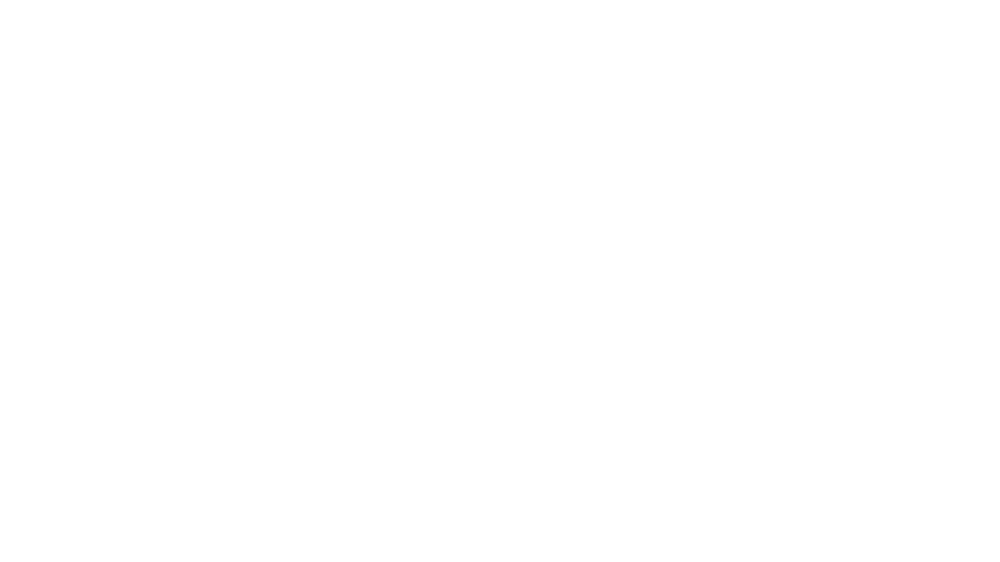

Traceback (most recent call last):
  File "/home/gerstenberger/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py", line 215, in process
    func(*args, **kwargs)
  File "/home/gerstenberger/miniconda3/lib/python3.6/site-packages/matplotlib/animation.py", line 1478, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


In [39]:
rescaled = c[0]#cv2.resize(a[0], (64,36))

X, Y = np.meshgrid(np.arange(width), np.arange(height))


fig, ax = plt.subplots(1,1, figsize = (16,9))
Q = ax.quiver(X, Y, np.flipud(rescaled[:,:,0]), -np.flipud(rescaled[:,:,1]), 
              units='xy', color='g', scale = 1.0)
ax.imshow(cap.read()[1])

def animate(i):
    print(".", end ="")
    i *= skip_factor#skip frames
    
    img = video_reader.get_data(start_frame+ i)
    ax.imshow(cv2.resize(img, (256,144)), extent = [0,width,0,height], origin = "upper")
    
    rescaled = np.array(c[start_frame+i], dtype=np.float32)#cv2.resize(a[start_frame+i], (64,36))
    #rescaled = rescaled / 16.0
    rescaled = cv2.resize(rescaled, (width,height)) 
    
    
    Q.set_UVC(np.flipud(rescaled[:,:,0]), -np.flipud(rescaled[:,:,1]))

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=frames)

from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
import matplotlib.pyplot as plt

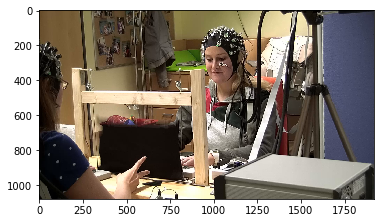

In [148]:
plt.imshow(video_reader.get_data(9438))

In [ ]:
mothistmap1 = compute_weighted_histograms(a)